# Self Case Study-1_Pump it up-Data Mining the Water Table

## Section-I

## 1. Business Problem

The problem that we are going to solve here is addressing the issue of scarcity of clean drinking water
that is being faced by population of Tanzania owing to non-functioning of some of the water-points.
Using the given dataset, we have to predict which pumps are functional, which need some
repairs, and which don't work at all. We have to predict one of these three classes based on a
number of variables about what kind of pump is operating, when it was installed, what is
geographic location and how it is managed etc. A smart understanding of which water-points
will fail can improve maintenance operations and ensure that clean, potable water is available to
communities across Tanzania

## 2. Mapping the real-world problem to an ML problem

### 2.1 Description

This particular business problem can be formulated as ML classification problem where the goal
is to predict the operating condition of a water-point for each record in the dataset.
The target variable/ classes is named as status_group which has three values such as
‘functional’, ‘non-functional’ or ‘needs repair’

### 2.2 Data Source

The data can be downloaded from the link: https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/. 
        
We are provided with 4 no. CSV files as follows,
1. train.csv
2. test.csv
3. train_labels.csv
4. SubmissionFormat.csv

The train dataset has 59400 datapoints and 40 features

## 3 Exploratory Data Analysis

### 3.1 Importing dependencies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline  
import re
import time
import warnings
warnings.filterwarnings("ignore")
import numpy as np
from nltk.corpus import stopwords
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
import sys

### 3.2 Reading Data

In [10]:
pd.options.display.max_columns=60 #for reading all columns

In [7]:
df_train = pd.read_csv("train.csv")

In [8]:
df_train.shape

(59400, 40)

In [11]:
df_train.head() # loading train dataset

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [12]:
df_train_labels = pd.read_csv("train_lables.csv") #loading train labels data

In [13]:
df_train_labels

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional
...,...,...
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional


### 3.3 Merging df_train & df_train_labels

In [280]:
df = df_train.merge(df_train_labels, how='left', on='id')

### 3.4 Reading mearged data

In [281]:
print('Number of data points : ', df.shape[0])
print('Number of features : ', df.shape[1])
print('Features : ', df.columns.values)
df.head()

Number of data points :  59400
Number of features :  41
Features :  ['id' 'amount_tsh' 'date_recorded' 'funder' 'gps_height' 'installer'
 'longitude' 'latitude' 'wpt_name' 'num_private' 'basin' 'subvillage'
 'region' 'region_code' 'district_code' 'lga' 'ward' 'population'
 'public_meeting' 'recorded_by' 'scheme_management' 'scheme_name' 'permit'
 'construction_year' 'extraction_type' 'extraction_type_group'
 'extraction_type_class' 'management' 'management_group' 'payment'
 'payment_type' 'water_quality' 'quality_group' 'quantity'
 'quantity_group' 'source' 'source_type' 'source_class' 'waterpoint_type'
 'waterpoint_type_group' 'status_group']


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


### 3.5 Understanding the columns of dataset 

In [282]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [283]:
df.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

#### 3. 5.1 Data visualization using library 'pandas_profiling'

In [25]:
import pandas_profiling as pp

In [284]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### 3.5.2 Exploring the columns individually one by one for more clarity

##### 3.5.2.1 Column 'amount_tsh'

In [285]:
df['amount_tsh'].value_counts()

0.00         41639
500.00        3102
50.00         2472
1000.00       1488
20.00         1463
200.00        1220
100.00         816
10.00          806
30.00          743
2000.00        704
250.00         569
300.00         557
5000.00        450
5.00           376
25.00          356
3000.00        334
1200.00        267
1500.00        197
6.00           190
600.00         176
4000.00        156
2400.00        145
2500.00        139
6000.00        125
7.00            69
8000.00         61
750.00          59
40.00           59
10000.00        57
12000.00        51
20000.00        45
3600.00         42
450.00          42
400.00          42
2200.00         31
700.00          24
70.00           23
4700.00         23
150.00          21
33.00           20
15000.00        16
60.00           15
15.00           15
2800.00         14
2.00            13
7200.00         12
1300.00         10
25000.00         9
6500.00          9
35.00            8
7500.00          8
30000.00         8
117000.00   

In [286]:
df.loc[df['amount_tsh']==0].groupby('status_group').size()

status_group
functional                 19706
functional needs repair     3048
non functional             18885
dtype: int64

In [287]:
df.groupby(['amount_tsh','status_group']).size() 

amount_tsh  status_group           
0.00        functional                 19706
            functional needs repair     3048
            non functional             18885
0.20        non functional                 3
0.25        functional                     1
1.00        non functional                 3
2.00        functional                    13
5.00        functional                   330
            non functional                46
6.00        functional                   174
            functional needs repair        3
            non functional                13
7.00        functional                    54
            non functional                15
9.00        non functional                 1
10.00       functional                   623
            functional needs repair       16
            non functional               167
12.00       functional                     1
15.00       functional                    14
            non functional                 1
20.00       functio

From the above analysis of 'amount_tsh' it is observed that the column has total 41639 zero values which is about 70% of total datapoints. When the static head is zero, the suction and discharge points are at same level. this is in favour of the pump. we have total 19706 functinal water points when static head is zero. However there are 18885 non functional water points at zero head. 

##### 3.5.2.2 Column 'date_recorded'

In [288]:
df['date_recorded'].isna().sum()

0

In [289]:
df.date_recorded.nunique()

356

This column has zero null values and total 356 unique values. For now let us keep this column as is.

##### 3.5.2.3 Column 'funder'

In [290]:
df.funder.nunique()

1897

In [291]:
df['funder'].isna().sum()

3635

this column has 1897 unique values and 3635 missing values

In [293]:
pd.set_option('display.max_rows', None)
df['funder'].value_counts().head(150).sum()

47206

In [294]:
df['funder'].fillna(value='Undefined',inplace=True) 
df['funder'].replace(to_replace = '0', value ='Undefined' , inplace=True) #replacing '0' & missing values with 'Undefined'

In [295]:
df['funder'].value_counts().head(30)

Government Of Tanzania    9084
Undefined                 4412
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
Kkkt                      1287
World Vision              1246
Unicef                    1057
Tasaf                      877
District Council           843
Dhv                        829
Private Individual         826
Dwsp                       811
Norad                      765
Germany Republi            610
Tcrs                       602
Ministry Of Water          590
Water                      583
Dwe                        484
Netherlands                470
Hifab                      450
Adb                        448
Lga                        442
Amref                      425
Fini Water                 393
Oxfam                      359
Wateraid                   333
Rc Church                  321
Isf                        316
Name: funder, dtype: int64

In [296]:
top_30_funders = ['Government Of Tanzania','Undefined','Danida','Hesawa','Rwssp','World Bank','Kkkt','World Vision','Unicef','Tasaf','District Council','Dhv','Private Individual','Dwsp','Norad','Germany Republi','Tcrs','Ministry Of Water','Water','Dwe','Netherlands','Hifab','Adb','Lga','Amref','Fini Water','Oxfam','Wateraid','Rc Church','Isf']

In [297]:
p = list(df.loc[~df["funder"].isin(top_30_funders), "funder"])

In [298]:
df['funder'].replace(to_replace = p , value ='other' , inplace=True)

In [299]:
df['funder'].unique()

array(['other', 'Unicef', 'Dwsp', 'Rwssp', 'Wateraid', 'Danida',
       'World Vision', 'Hesawa', 'Isf', 'Government Of Tanzania', 'Water',
       'Private Individual', 'Undefined', 'Lga', 'District Council',
       'Kkkt', 'Norad', 'Dwe', 'Rc Church', 'Tcrs', 'Germany Republi',
       'Netherlands', 'Tasaf', 'World Bank', 'Fini Water', 'Dhv', 'Amref',
       'Ministry Of Water', 'Adb', 'Oxfam', 'Hifab'], dtype=object)

In [300]:
df['funder'].isna().sum()

0

In [301]:
df['funder'].value_counts().head(20)

other                     22498
Government Of Tanzania     9084
Undefined                  4412
Danida                     3114
Hesawa                     2202
Rwssp                      1374
World Bank                 1349
Kkkt                       1287
World Vision               1246
Unicef                     1057
Tasaf                       877
District Council            843
Dhv                         829
Private Individual          826
Dwsp                        811
Norad                       765
Germany Republi             610
Tcrs                        602
Ministry Of Water           590
Water                       583
Name: funder, dtype: int64

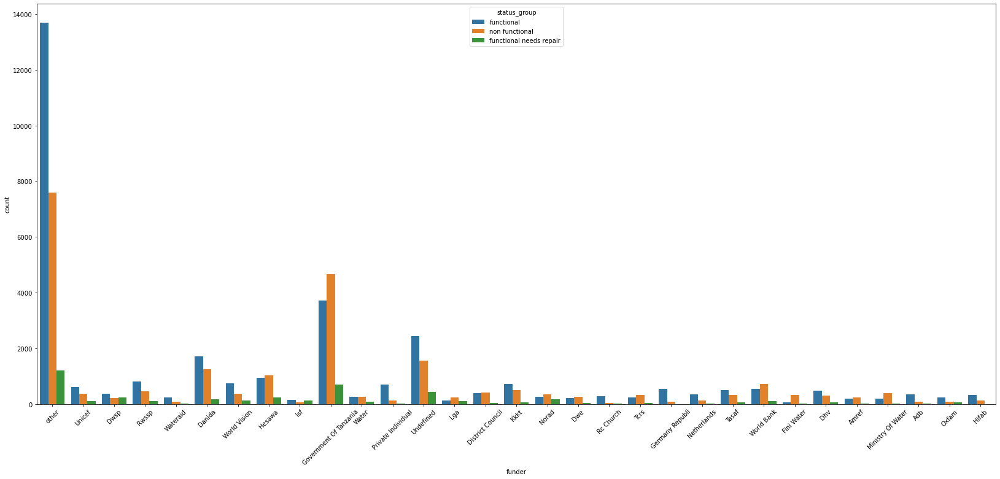

In [478]:
plt.figure(figsize=(28,12))
ax = sns.countplot(x='funder', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

As can be seen from the above plot the most of the waterpoints funded by government of tanzania are non-functional

##### 3.5.2.4 Column 'gps_height'

In [303]:
df['gps_height'].value_counts()

 0       20438
-15         60
-16         55
-13         55
 1290       52
-20         52
-14         51
 303        51
-18         49
-19         47
 1295       46
 1269       46
 1304       45
-23         45
 280        44
 1538       44
-8          44
 1286       44
-17         44
 320        43
 1332       43
 1319       42
 1264       42
 1317       42
 1359       42
 1401       42
-27         42
 1293       42
 1303       42
 1288       42
 1613       41
 1602       41
-6          41
 309        41
 1272       41
-11         41
 12         41
 1152       41
 1271       40
 1240       40
 1325       40
 1342       40
 1311       40
 338        40
 1180       40
 1322       40
-2          40
-21         40
 1330       40
 1323       40
 336        40
 1384       39
 17         39
 1314       39
 1307       39
 1597       39
 1289       39
 1370       39
 1306       38
 1161       38
 259        38
 306        38
-5          38
-9          38
 1329       38
-3          38
 1270     

In [304]:
df['gps_height'].isna().sum()

0

<AxesSubplot:xlabel='gps_height', ylabel='Density'>

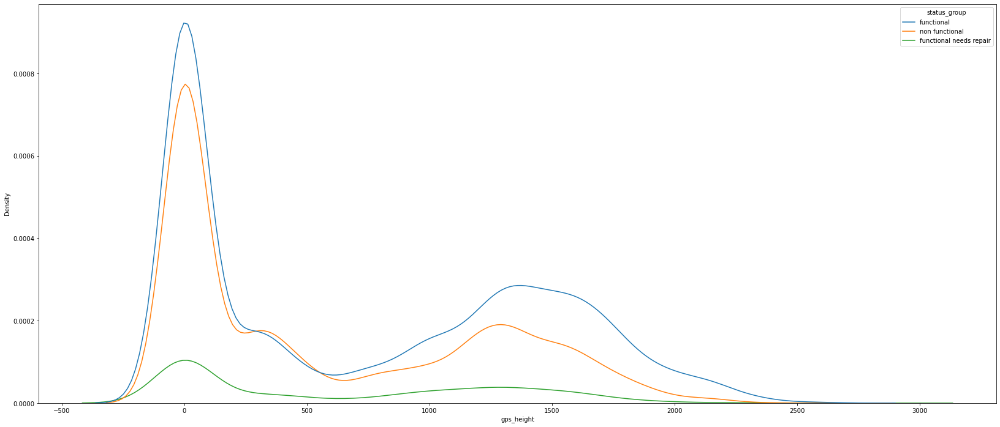

In [305]:
plt.figure(figsize=(28,12))
sns.kdeplot(data=df, x='gps_height', hue="status_group", gridsize=200)

##### 3.5.2.5 Column 'installer'

In [306]:
df['installer'].value_counts().head(100).sum()

43663

In [307]:
df['installer'].nunique()

2145

In [308]:
df['installer'].isna().sum()

3655

In [309]:
df['installer'].fillna(value='Undefined',inplace=True) 
df['installer'].replace(to_replace = '0', value ='Undefined' , inplace=True) #replacing '0' category with 'Undefined'

In [310]:
pd.set_option('display.max_rows', None)
df['installer'].value_counts().head(150)

DWE                              17402
Undefined                         4432
Government                        1825
RWE                               1206
Commu                             1060
DANIDA                            1050
KKKT                               898
Hesawa                             840
TCRS                               707
Central government                 622
CES                                610
Community                          553
DANID                              552
District Council                   551
HESAWA                             539
LGA                                408
World vision                       408
WEDECO                             397
TASAF                              396
District council                   392
Gover                              383
AMREF                              329
TWESA                              316
WU                                 301
Dmdd                               287
ACRA                     

In [311]:
df['installer'].replace(to_replace = ("Gove","Gover","GOVERM", "GOVERN", "GOVERNME", "Governmen","Government","GOVER"), value ="Government", inplace=True)
df['installer'].replace(to_replace = ("RW","RWE","RWE /Community","RWE Community","RWE/ Community","RWE/Community","RWE/DWE","RWE/TCRS","RWEDWE","RWET/WESA"), value ="RWE", inplace=True)
df['installer'].replace(to_replace = ("Commu", "Communit", "Community", "COMMUNITY BANK","Comunity"), value ="Community", inplace=True)
df['installer'].replace(to_replace = ("Danda","DANIAD","Danid","DANIDA","DANIDA CO","DANIDS","DANNIDA","DANID"), value ="DANIDA", inplace=True)
df['installer'].replace(to_replace = ("Cebtral Government","Cental Government","Centr","Centra Government","Centra govt","Central government","Central govt","Cetral government /RC","Tanzania Government","TANZANIAN GOVERNMENT"), value ="Central Government", inplace=True)
df['installer'].replace(to_replace = ("COUN","Counc","Council","Distri","District  Council","District Community j","District Counci","District council","District Council"), value ="District Council", inplace=True)
df['installer'].replace(to_replace = ("Hesawa","HESAW","Hesewa","HESAWA"),value ='HESAWA' , inplace=True)
df['installer'].replace(to_replace = ("World Division","World Visiin","World vision","World Vission","World Vision"),value ='World Vision' , inplace=True)
df['installer'].replace(to_replace = ("Distric Water Department","District Water Department","District water depar","District water department","Water Department"),value ='District water department' , inplace=True)
df['installer'].replace(to_replace = ("FINN WATER","FinW","FinWate","FinWater","Fini water","Fini Water" ),value ='Fini Water' , inplace=True)
df['installer'].replace(to_replace = ("RC","RC .Church","RC C","RC Ch","RC Churc","RC Church","RC CHURCH BROTHER","RC church/CEFA","RC church/Central Gover","RCchurch/CEFA","RC CHURCH"),value ="RC Church" , inplace=True)
df['installer'].replace(to_replace = ("Villa","VILLAGER","Villagerd","Villagers","Villages","Villege Council","Villi","villigers"),value ="Villagers" , inplace=True)

In [312]:
df['installer'].value_counts().head(30)

DWE                   17402
Undefined              4432
Government             2592
DANIDA                 1679
Community              1670
HESAWA                 1381
RWE                    1306
District Council       1162
Central Government     1080
KKKT                    898
TCRS                    707
World Vision            693
CES                     610
Fini Water              553
RC Church               490
LGA                     408
WEDECO                  397
TASAF                   396
AMREF                   329
TWESA                   316
WU                      301
Dmdd                    287
ACRA                    278
Villagers               271
SEMA                    249
DW                      246
OXFAM                   234
Da                      224
Idara ya maji           222
UNICEF                  222
Name: installer, dtype: int64

In [313]:
top_30_installer = ["DWE","Undefined","Government","DANIDA","Community","HESAWA","RWE","District Council","Central Government","KKKT","TCRS","World Vision","CES","Fini Water","RC Church","LGA","WEDECO","TASAF","AMREF","TWESA","WU","Dmdd","ACRA","Villagers","SEMA","DW","OXFAM","Da","Idara ya maji","UNICEF"]

In [314]:
q = list(df.loc[~df["installer"].isin(top_30_installer), "installer"])
df['installer'].replace(to_replace = q , value ='other' , inplace=True)

In [315]:
df['installer'].nunique()

31

In [316]:
df['installer'].isna().sum()

0

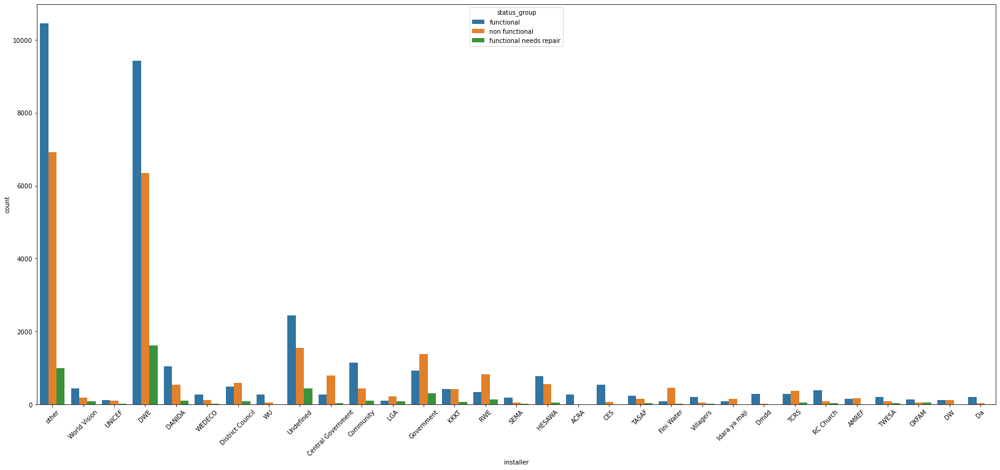

In [477]:
plt.figure(figsize=(28,12))
ax = sns.countplot(x='installer', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

From the above plot it can be seen that most of the woterpoints install by goverment are non-functional. 

##### 3.5.2.6 Column 'longitude & latitude'

In [318]:
df['longitude'].isna().sum()

0

In [319]:
df['latitude'].isna().sum()

0

In [320]:
df['longitude'].nunique()

57516

In [321]:
df['latitude'].nunique()

57517

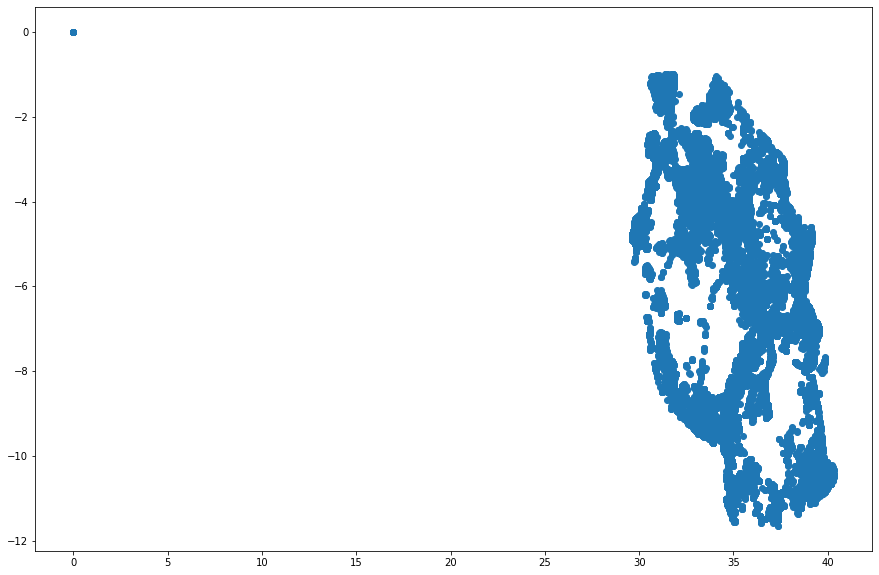

In [322]:
plt.figure(figsize=(15,10))
plt.scatter(x="longitude", y="latitude", data=df)
plt.show()

From the above scatterplot it is seen that there is outlier at 0. we will replace the same with 'mean'

In [323]:
df['longitude'].mean()

34.07742669202832

In [324]:
df['longitude'].replace(to_replace = 0 , value =34.07742669202832 , inplace=True)

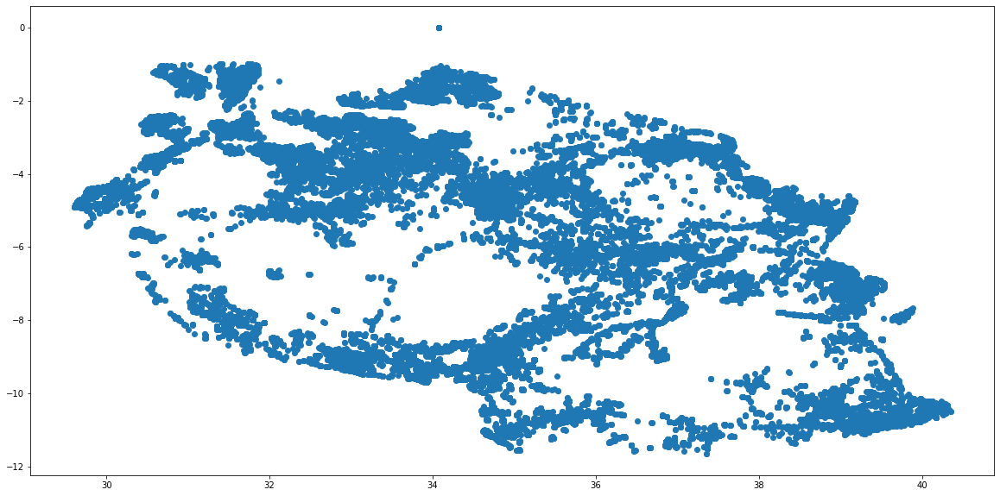

In [325]:
plt.figure(figsize=(20,10))
plt.scatter(x="longitude", y="latitude", data=df)
plt.show()

##### 3.5.2.7 Column 'wpt_name'

In [326]:
df['wpt_name'].isna().sum()

0

In [327]:
df['wpt_name'].nunique()

37400

In [328]:
df['wpt_name'].value_counts()

none                              3563
Shuleni                           1748
Zahanati                           830
Msikitini                          535
Kanisani                           323
Bombani                            271
Sokoni                             260
Ofisini                            254
School                             208
Shule Ya Msingi                    199
Shule                              152
Sekondari                          146
Muungano                           133
Mkombozi                           111
Madukani                           104
Mbugani                             94
Hospital                            94
Upendo                              93
Kituo Cha Afya                      90
Mkuyuni                             88
Umoja                               84
Center                              83
Ccm                                 81
Kisimani                            78
Ofisi Ya Kijiji                     76
Mtakuja                  

In [329]:
df['wpt_name'].value_counts().head(20)

none               3563
Shuleni            1748
Zahanati            830
Msikitini           535
Kanisani            323
Bombani             271
Sokoni              260
Ofisini             254
School              208
Shule Ya Msingi     199
Shule               152
Sekondari           146
Muungano            133
Mkombozi            111
Madukani            104
Mbugani              94
Hospital             94
Upendo               93
Kituo Cha Afya       90
Mkuyuni              88
Name: wpt_name, dtype: int64

In [330]:
top_20_wpt = ["none","Shuleni","Zahanati","Msikitini","Kanisani","Bombani","Sokoni","Ofisini","School","Shule Ya Msingi","Shule","Sekondari","Muungano","Mkombozi","Madukani","Mbugani","Hospital","Upendo","Kituo Cha Afya","Mkuyuni"]

In [331]:
w = list(df.loc[~df["wpt_name"].isin(top_20_wpt), "wpt_name"])
df['wpt_name'].replace(to_replace = w , value ='other' , inplace=True)

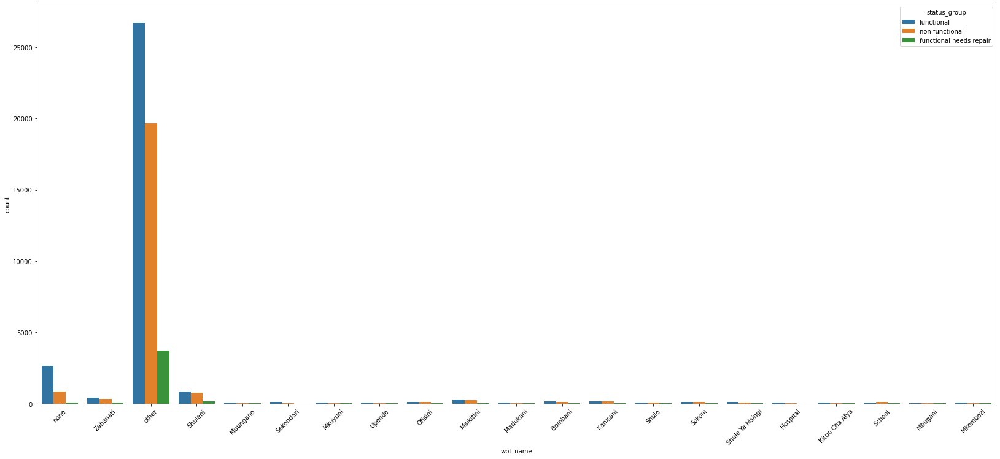

In [476]:
plt.figure(figsize=(28,12))
ax = sns.countplot(x='wpt_name', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

In [ ]:
"wpt_name" has 37400 unique values so it does not make sense to retain this feature. the same need be droped.

In [528]:
df.drop(columns='wpt_name', inplace=True)

##### 3.5.2.8 Column 'num_private'

In [333]:
df['num_private'].nunique()

65

In [334]:
df['num_private'].value_counts()

0       58643
6          81
1          73
5          46
8          46
32         40
45         36
15         35
39         30
93         28
3          27
7          26
2          23
65         22
47         21
4          20
102        20
17         17
80         15
20         14
25         12
11         11
34         10
41         10
16          8
120         7
150         6
22          6
50          5
12          5
24          5
58          4
38          4
10          4
9           4
14          3
61          3
26          2
27          2
180         1
1776        1
55          1
300         1
111         1
60          1
755         1
240         1
450         1
94          1
213         1
30          1
141         1
62          1
160         1
280         1
35          1
131         1
672         1
668         1
87          1
42          1
23          1
136         1
698         1
1402        1
Name: num_private, dtype: int64

most of the values in "num_private" are zero. hence we will remove this features 

In [335]:
df.drop(columns='num_private',inplace=True )

##### 3.5.2.9 Column 'basin'

In [336]:
df['basin'].value_counts()

Lake Victoria              10248
Pangani                     8940
Rufiji                      7976
Internal                    7785
Lake Tanganyika             6432
Wami / Ruvu                 5987
Lake Nyasa                  5085
Ruvuma / Southern Coast     4493
Lake Rukwa                  2454
Name: basin, dtype: int64

In [337]:
df['basin'].isna().sum()

0

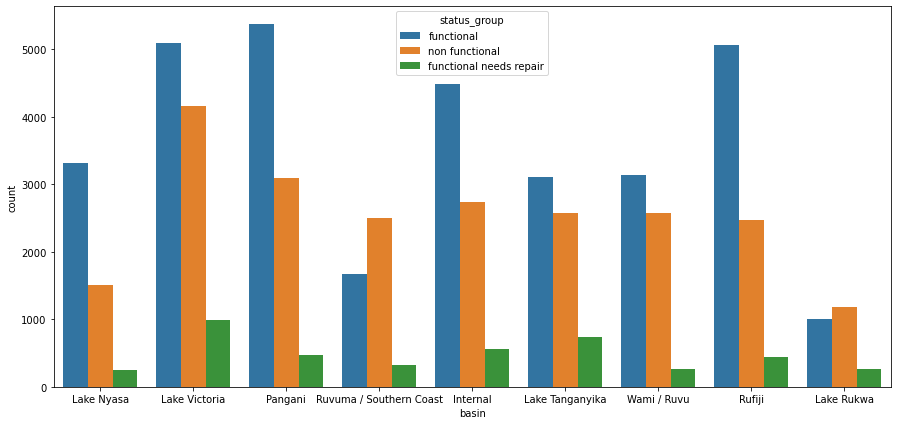

In [338]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='basin', hue="status_group", data=df)

This feature seems have good corelation with class variable 'status_group'

##### 3.5.2.10 Column 'subvillage', 'region'

In [339]:
df['subvillage'].isna().sum()

371

In [340]:
df['subvillage'].nunique()

19287

In [341]:
df['subvillage'].value_counts()

Madukani                          508
Shuleni                           506
Majengo                           502
Kati                              373
Mtakuja                           262
Sokoni                            232
M                                 187
Muungano                          172
Mbuyuni                           164
Mlimani                           152
Songambele                        147
Msikitini                         134
Miembeni                          134
1                                 132
Kibaoni                           114
Kanisani                          111
I                                 109
Mapinduzi                         109
Mjimwema                          108
Mjini                             108
Mkwajuni                          104
Mwenge                            102
Mabatini                           98
Azimio                             98
Mission                            95
Mbugani                            95
Bwawani     

In [342]:
df['region'].isna().sum()

0

In [343]:
df['region'].nunique()

21

In [344]:
df['region'].value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [345]:
df.groupby(['region','subvillage']).size()

region         subvillage                    
Arusha         Afya                               15
               Ahara                               1
               Alairataat                          3
               Alakirikir                          4
               Alasai                              1
               Aleilelai                           4
               Alsini                              2
               Ambara                              1
               Ambureni                            8
               Arahati                             4
               Arashi                              3
               Arati                               5
               Arauyo                             21
               Ariahati                            1
               Arkaria                             5
               Arudeko                            11
               Ascarida                            1
               Athin Kati                          1


'subvillage' and 'region' both provide information about location of wells. as 'subvillage' and more number of categorical values we will drop column 'subvillage'

In [346]:
df.drop(columns='subvillage',inplace=True )

In [347]:
df.shape

(59400, 39)

##### 3.5.2.12 Column 'region_code', 'district_code'

In [348]:
df['region_code'].nunique()

27

In [349]:
df['district_code'].nunique()

20

In [350]:
df['region_code'].value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

In [351]:
df['district_code'].value_counts()

1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

In [352]:
df.groupby(['region_code','district_code']).size()

region_code  district_code
1            0                  23
             1                 888
             3                 361
             4                 347
             5                 358
             6                 224
2            1                 189
             2                1206
             3                 109
             5                 201
             6                 310
             7                1009
3            1                 595
             2                 519
             3                 877
             4                1225
             5                 620
             6                 109
             7                 434
4            1                 698
             2                 408
             3                 323
             4                 110
             5                 293
             6                 266
             7                 127
             8                 288
5            1              

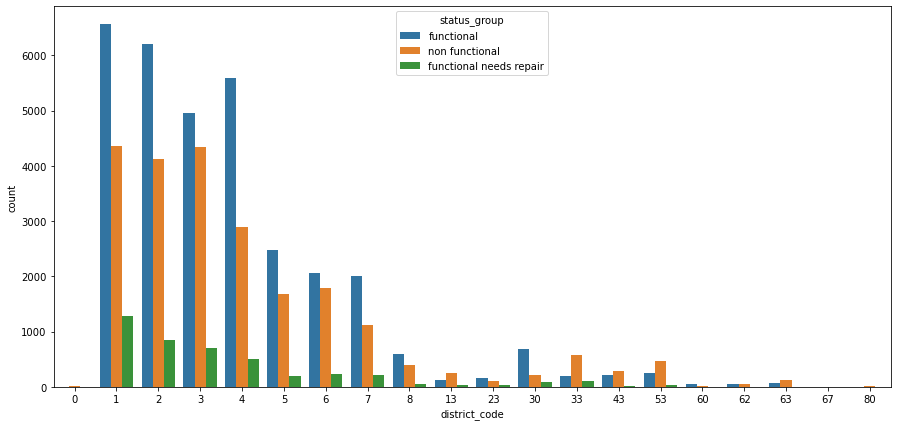

In [353]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='district_code', hue="status_group", data=df)

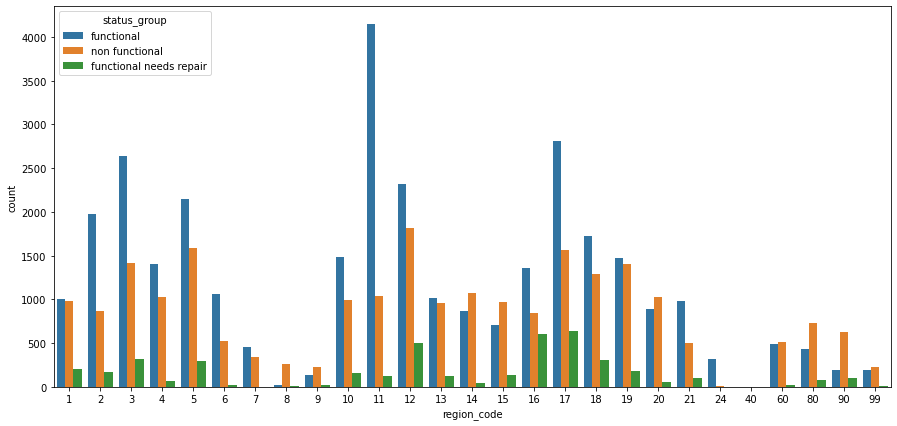

In [354]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='region_code', hue="status_group", data=df)

For now we will keep the feature "district_code" and remove "region_code"

In [355]:
df.drop(columns='region_code',inplace=True )

In [356]:
df.shape

(59400, 38)

##### 3.5.2.13 Column 'lga', 'ward'

In [357]:
df['lga'].isna().sum()

0

In [358]:
df['ward'].isna().sum()

0

In [360]:
df['lga'].value_counts()

Njombe              2503
Arusha Rural        1252
Moshi Rural         1251
Bariadi             1177
Rungwe              1106
Kilosa              1094
Kasulu              1047
Mbozi               1034
Meru                1009
Bagamoyo             997
Singida Rural        995
Kilombero            959
Same                 877
Kibondo              874
Kyela                859
Kahama               836
Magu                 824
Kigoma Rural         824
Maswa                809
Karagwe              771
Mbinga               750
Iringa Rural         728
Serengeti            716
Namtumbo             694
Lushoto              694
Songea Rural         693
Mpanda               679
Mvomero              671
Ngara                669
Ulanga               665
Makete               630
Kwimba               627
Mbarali              626
Hai                  625
Rombo                594
Shinyanga Rural      588
Nzega                575
Ludewa               564
Mkuranga             560
Iramba               544


In [361]:
df['lga'].nunique()

125

In [362]:
df['ward'].nunique()

2092

In [363]:
df['ward'].isna().sum()

0

In [364]:
df['ward'].value_counts()

Igosi                      307
Imalinyi                   252
Siha Kati                  232
Mdandu                     231
Nduruma                    217
Mishamo                    203
Kitunda                    203
Msindo                     201
Chalinze                   196
Maji ya Chai               190
Usuka                      187
Ngarenanyuki               172
Chanika                    171
Vikindu                    162
Mtwango                    153
Matola                     145
Zinga/Ikerege              141
Wanging'ombe               139
Maramba                    139
Itete                      137
Magomeni                   135
Ifakara                    134
Kikatiti                   134
Olkokola                   133
Maposeni                   130
Mvomero                    129
Igongolo                   129
Mlangali                   125
Nkoma                      122
Nkungulu                   121
Mahongole                  121
Rujewa                     120
Simbo   

In [368]:
df.groupby(["lga", "ward"]).size()

lga               ward                   
Arusha Rural      Bangata                     33
                  Bwawani                     37
                  Ilkiding'a                  86
                  Kimnyaki                    79
                  Kiranyi                    115
                  Kisongo                     33
                  Mateves                     22
                  Mlangarini                  92
                  Moivo                       44
                  Moshono                     44
                  Murieti                     29
                  Musa                        29
                  Mwandeti                    17
                  Nduruma                    205
                  Oldonyosambu                77
                  Oljoro                       8
                  Olkokola                   133
                  Oltroto                     75
                  Oltrumet                    52
                  Sokoni II

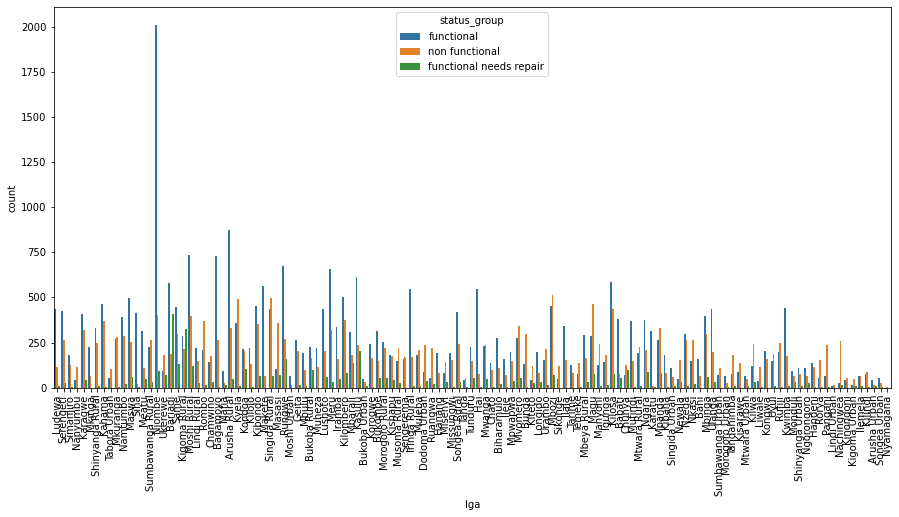

In [480]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='lga', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=90)

For now we will remove 'ward' and keep "lga"

In [399]:
df.drop(columns='ward',inplace=True )

##### 3.5.2.14 Column 'population'

In [370]:
df["population"].isna().sum()

0

In [371]:
df["population"].nunique()

1049

In [372]:
df["population"].value_counts()

0        21381
1         7025
200       1940
150       1892
250       1681
300       1476
100       1146
50        1139
500       1009
350        986
120        916
400        775
60         706
30         626
40         552
80         533
450        499
20         462
600        438
230        388
75         289
1000       278
800        269
90         265
130        264
25         255
320        249
35         245
360        222
140        215
70         209
210        209
45         205
15         193
700        192
1500       190
180        183
650        177
65         175
1200       168
10         163
420        162
240        154
750        153
56         150
2000       130
160        127
260        125
55         116
125        113
96         112
540        110
560        106
280        104
550        101
86          99
380         80
98          77
340         77
220         74
270         72
170         72
85          70
900         70
520         69
256         66
530       

This fearure does not have missing values but most of the values are zero. let us explore more

In [384]:
df.loc[df["population"]!=0].describe()

,id,amount_tsh,gps_height,longitude,latitude,district_code,population,construction_year
count,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000
mean,37107.559115,447.787681,969.889634,36.074387,-6.139781,6.299456,281.087167,1961.399721
std,21406.803661,3706.770967,612.544787,2.586779,2.737733,11.303334,564.687660,263.994165
min,1.000000,0.000000,-90.000000,29.607122,-11.649440,1.000000,1.000000,0.000000
25%,18514.500000,0.000000,347.000000,34.715340,-8.388839,2.000000,40.000000,1986.000000
50%,37128.000000,0.000000,1135.000000,36.706815,-5.750877,3.000000,150.000000,2000.000000
75%,55505.500000,100.000000,1465.000000,37.940149,-3.597016,5.000000,324.000000,2008.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-1.042375,67.000000,30500.000000,2013.000000


We will replace zeros with mean value

In [385]:
df['population'].replace(to_replace = 0, value = 281.087167 , inplace=True)

In [386]:
df["population"].describe()

count    59400.000000
mean       281.087167
std        451.765813
min          1.000000
25%        100.000000
50%        281.087167
75%        281.087167
max      30500.000000
Name: population, dtype: float64

In [387]:
df["population"].value_counts()

281.087167      21381
1.000000         7025
200.000000       1940
150.000000       1892
250.000000       1681
300.000000       1476
100.000000       1146
50.000000        1139
500.000000       1009
350.000000        986
120.000000        916
400.000000        775
60.000000         706
30.000000         626
40.000000         552
80.000000         533
450.000000        499
20.000000         462
600.000000        438
230.000000        388
75.000000         289
1000.000000       278
800.000000        269
90.000000         265
130.000000        264
25.000000         255
320.000000        249
35.000000         245
360.000000        222
140.000000        215
70.000000         209
210.000000        209
45.000000         205
15.000000         193
700.000000        192
1500.000000       190
180.000000        183
650.000000        177
65.000000         175
1200.000000       168
10.000000         163
420.000000        162
240.000000        154
750.000000        153
56.000000         150
2000.00000

In [389]:
#df.groupby(['population', 'status_group']).size()

<AxesSubplot:xlabel='population', ylabel='Density'>

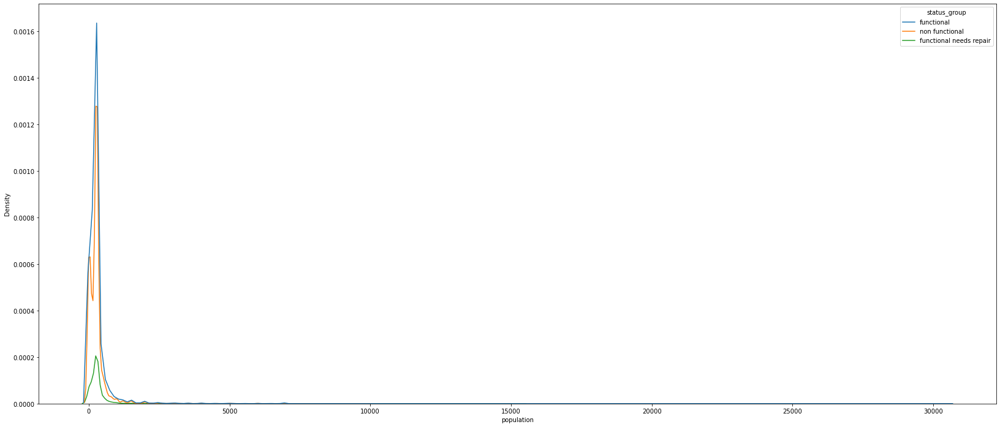

In [390]:
plt.figure(figsize=(28,12))
sns.kdeplot(data=df, x='population', hue="status_group", gridsize=200)

From the above kd plot it is understood that the more populated area is, higher the chances of the waterpoint being functional 

##### 3.5.2.14 Column 'public_meeting'

In [391]:
df['public_meeting'].value_counts()

True     51011
False     5055
Name: public_meeting, dtype: int64

In [392]:
df['public_meeting'].isna().sum()

3334

there are 3334 missing values, we will replace those with most occurring values i.e. 'True'

In [394]:
df['public_meeting'].fillna(value=True, inplace=True)

In [395]:
df['public_meeting'].value_counts()

True     54345
False     5055
Name: public_meeting, dtype: int64

##### 3.5.2.14 Column 'recorded_by'

In [396]:
df['recorded_by'].isna().sum()

0

In [397]:
df['recorded_by'].value_counts()

GeoData Consultants Ltd    59400
Name: recorded_by, dtype: int64

This featured will not be useful as it has only one value. hence we will remove the same. 

In [400]:
df.drop(columns='recorded_by', inplace = True)

In [401]:
df.shape

(59400, 36)

##### 3.5.2.15 Column "scheme_management", "scheme_name", "management", "management_group"

In [408]:
print(df['scheme_management'].isna().sum())
print(df['scheme_management'].nunique())
df['scheme_management'].value_counts()

3877
12


VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64

In [407]:
print(df['scheme_name'].isna().sum())
print(df['scheme_name'].nunique())
df['scheme_name'].value_counts()

28166
2696


K                                                 682
None                                              644
Borehole                                          546
Chalinze wate                                     405
M                                                 400
DANIDA                                            379
Government                                        320
Ngana water supplied scheme                       270
wanging'ombe water supply s                       261
wanging'ombe supply scheme                        234
I                                                 229
Bagamoyo wate                                     229
Uroki-Bomang'ombe water sup                       209
N                                                 204
Kirua kahe gravity water supply trust             193
Machumba estate pipe line                         185
Makwale water supplied sche                       166
Kijiji                                            161
S                           

In [409]:
print(df['management'].isna().sum())
print(df['management'].nunique())
df['management'].value_counts()

0
12


vwc                 40507
wug                  6515
water board          2933
wua                  2535
private operator     1971
parastatal           1768
water authority       904
other                 844
company               685
unknown               561
other - school         99
trust                  78
Name: management, dtype: int64

In [410]:
print(df['management_group'].isna().sum())
print(df['management_group'].nunique())
df['management_group'].value_counts()

0
5


user-group    52490
commercial     3638
parastatal     1768
other           943
unknown         561
Name: management_group, dtype: int64

the columns 'management' & 'scheme_management' has almost similar categorical values. So it is better to drop one of them. as can be seen above, 'management' has zero missing values whereas 'scheme_management' has 3877 missing values. In view of this we will drop the column 'scheme_management' 

In [411]:
df.drop(columns=['scheme_management'], inplace=True)

In [412]:
df.shape

(59400, 35)

In [413]:
df.groupby(['management_group','management']).size() 

management_group  management      
commercial        company               685
                  private operator     1971
                  trust                  78
                  water authority       904
other             other                 844
                  other - school         99
parastatal        parastatal           1768
unknown           unknown               561
user-group        vwc                 40507
                  water board          2933
                  wua                  2535
                  wug                  6515
dtype: int64

From above analysis it is understood that the column 'management_group' contains group of categories present in the column  'management'. Hence we will drop the column 'management_group' which has less information as compared to 'management'

In [414]:
df.drop(columns='management_group', inplace=True)

In [415]:
df.shape

(59400, 34)

Further, the column 'scheme_name' has 28166 missing values and 2696 categories. We will drop the same for now. 

In [416]:
df.drop(columns='scheme_name', inplace=True)

In [417]:
df.shape

(59400, 33)

##### 3.5.2.16 Column "permit"

In [418]:
df['permit'].value_counts()

True     38852
False    17492
Name: permit, dtype: int64

In [419]:
df['permit'].isna().sum()

3056

There are 3334 missing values, we will replace those with most occurring values i.e. 'True'

In [420]:
df['permit'].fillna(value=True, inplace=True)

In [421]:
df['permit'].value_counts()

True     41908
False    17492
Name: permit, dtype: int64

##### 3.5.2.17 Column "construction_year"

In [423]:
print(df['construction_year'].isna().sum())
print(df['construction_year'].nunique())

0
55


In [422]:
df['construction_year'].value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

We can make use of this column in conjunction with the column 'date_recorded'. We can get time difference between the year which the waterpoint was contrcted in and the year which the data was recorded in. This time difference is nothing but the time which the waterpoint has been operational for. This way we can create a new feature called 'Operational_years'

first we will replace the missing values present in 'construction_year'

In [425]:
df.loc[df['construction_year']!=0].describe() #to know the statistic of feature without zero values

,id,amount_tsh,gps_height,longitude,latitude,district_code,population,construction_year
count,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000
mean,37083.008736,466.457534,1002.367760,35.983262,-6.235372,5.969786,279.585470,1996.814686
std,21420.922010,3541.036030,618.078669,2.558709,2.761317,10.700673,549.961837,12.472045
min,1.000000,0.000000,-63.000000,29.607122,-11.649440,1.000000,1.000000,1960.000000
25%,18489.500000,0.000000,372.000000,34.676719,-8.755274,2.000000,40.000000,1987.000000
50%,37078.000000,0.000000,1154.000000,36.648187,-6.064216,3.000000,150.000000,2000.000000
75%,55514.500000,200.000000,1488.000000,37.803940,-3.650661,5.000000,305.000000,2008.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-1.042375,63.000000,30500.000000,2013.000000


In [426]:
df['construction_year'].replace(to_replace = 0, value = 1996, inplace=True)
#replacing the missing values in construction_year column with mean value i.e. 1996

In [427]:
df.describe()

,id,amount_tsh,gps_height,longitude,latitude,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,35.116960,-5.706033e+00,5.629747,281.087167,1996.530657
std,21453.128371,2997.574558,693.116350,2.573963,2.946019e+00,9.633649,451.765813,10.073265
min,0.000000,0.000000,-90.000000,29.607122,-1.164944e+01,0.000000,1.000000,1960.000000
25%,18519.750000,0.000000,0.000000,33.354079,-8.540621e+00,2.000000,100.000000,1996.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,3.000000,281.087167,1996.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,5.000000,281.087167,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,80.000000,30500.000000,2013.000000


##### creating new column 'operational_years'

In [428]:
print(df.date_recorded.head(5))
print(df.construction_year.head(5))

0    2011-03-14
1    2013-03-06
2    2013-02-25
3    2013-01-28
4    2011-07-13
Name: date_recorded, dtype: object
0    1999
1    2010
2    2009
3    1986
4    1996
Name: construction_year, dtype: int64


In [429]:
df['date_recorded'] = pd.to_datetime(df['date_recorded']) #converting dates to 'datetime' datatype 

In [430]:
df['date_recorded'].head()

0   2011-03-14
1   2013-03-06
2   2013-02-25
3   2013-01-28
4   2011-07-13
Name: date_recorded, dtype: datetime64[ns]

In [431]:
df.date_recorded.dt.year.head(5)

0    2011
1    2013
2    2013
3    2013
4    2011
Name: date_recorded, dtype: int64

In [459]:
df['operational_year'] = df.date_recorded.dt.year - df.construction_year
df.operational_year.head(5)

0    12
1     3
2     4
3    27
4    15
Name: operational_year, dtype: int64

In [460]:
df['operational_year'].value_counts()

 15    14336
 16     5968
 17     2846
 3      2740
 1      2303
 2      2129
 5      1980
 4      1890
 13     1869
 7      1404
 6      1382
 11     1352
 8      1173
 14     1160
 33     1120
 23      905
 10      868
 9       814
 19      766
 27      762
 18      754
 31      709
 28      709
 35      647
 39      601
 37      600
 26      589
 0       588
 25      583
 21      578
 29      564
 12      559
 20      541
 41      488
 30      359
 43      356
 38      351
 36      325
 22      323
 24      261
 40      233
 34      184
 32      174
 53       91
 42       90
 50       84
 45       66
 46       48
 44       47
 48       41
 51       31
 49       25
 47       14
 52       11
-5         3
-4         2
-2         1
-7         1
-1         1
-3         1
Name: operational_year, dtype: int64

<AxesSubplot:xlabel='operational_year', ylabel='Density'>

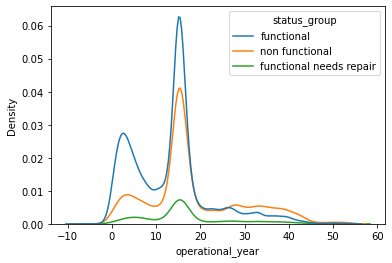

In [434]:
sns.kdeplot(data=df, x='operational_year', hue="status_group", gridsize=200)

In [436]:
# plt.figure(figsize=(26,15))
# ax = sns.countplot(data=df, x='operational_year', hue="status_group")

There are some anamolies in data as some of the values in 'operational_year' are negative and operatinal years cant be negative. we will replace the negative values with minimum value. 

In [461]:
df.loc[~df['operational_year']<0].describe()

,id,amount_tsh,gps_height,longitude,latitude,district_code,population,construction_year,operational_year
count,59391.000000,59391.000000,59391.000000,59391.000000,5.939100e+04,59391.000000,59391.000000,59391.000000,59391.000000
mean,37116.883753,317.687240,668.297688,35.116650,-5.705857e+00,5.628597,281.086305,1996.528919,15.393949
std,21452.886206,2997.799583,693.118358,2.573822,2.946049e+00,9.632382,451.785541,10.073017,10.089123
min,0.000000,0.000000,-90.000000,29.607122,-1.164944e+01,0.000000,1.000000,1960.000000,0.000000
25%,18522.500000,0.000000,0.000000,33.353967,-8.540784e+00,2.000000,100.000000,1996.000000,8.000000
50%,37063.000000,0.000000,369.000000,34.908362,-5.021241e+00,3.000000,281.087167,1996.000000,15.000000
75%,55661.000000,20.000000,1319.000000,37.177970,-3.326129e+00,5.000000,281.087167,2004.000000,17.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,80.000000,30500.000000,2013.000000,53.000000


we will replace the negative values in 'operational_year' with the minimum value which is zero

In [462]:
df.loc[df['operational_year']<0, 'operational_year'] = 0

In [463]:
df['operational_year'].value_counts()

15    14336
16     5968
17     2846
3      2740
1      2303
2      2129
5      1980
4      1890
13     1869
7      1404
6      1382
11     1352
8      1173
14     1160
33     1120
23      905
10      868
9       814
19      766
27      762
18      754
31      709
28      709
35      647
39      601
37      600
0       597
26      589
25      583
21      578
29      564
12      559
20      541
41      488
30      359
43      356
38      351
36      325
22      323
24      261
40      233
34      184
32      174
53       91
42       90
50       84
45       66
46       48
44       47
48       41
51       31
49       25
47       14
52       11
Name: operational_year, dtype: int64

In [ ]:
# f = lambda x: 0 if x<0 else 1
# df['my_column'] = df['my_column'].map(f) #above can be done using map fuction

<AxesSubplot:xlabel='operational_year', ylabel='Density'>

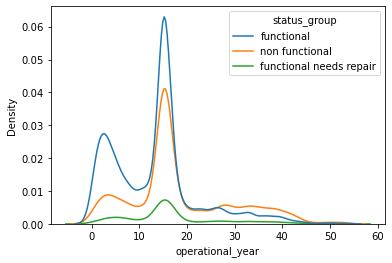

In [464]:
sns.kdeplot(data=df, x='operational_year', hue="status_group", gridsize=200)

From above plot, we can see that the negative values have disappeared. We will now drop columns 'construction_year' & 'date_recorded'

In [465]:
df.drop(columns=["construction_year", "date_recorded"], inplace=True)

In [466]:
df.shape

(59400, 32)

In [469]:
df.columns

Index(['id', 'amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'wpt_name', 'basin', 'region', 'district_code', 'lga',
       'population', 'public_meeting', 'permit', 'extraction_type',
       'extraction_type_group', 'extraction_type_class', 'management',
       'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity',
       'quantity_group', 'source', 'source_type', 'source_class',
       'waterpoint_type', 'waterpoint_type_group', 'status_group',
       'operational_year'],
      dtype='object')

##### 3.5.2.18 Column "extraction_type", "extraction_type_group", "extraction_type_class"

In [470]:
print(df['extraction_type'].isna().sum())
print(df['extraction_type'].nunique())
df['extraction_type'].value_counts()

0
18


gravity                      26780
nira/tanira                   8154
other                         6430
submersible                   4764
swn 80                        3670
mono                          2865
india mark ii                 2400
afridev                       1770
ksb                           1415
other - rope pump              451
other - swn 81                 229
windmill                       117
india mark iii                  98
cemo                            90
other - play pump               85
walimi                          48
climax                          32
other - mkulima/shinyanga        2
Name: extraction_type, dtype: int64

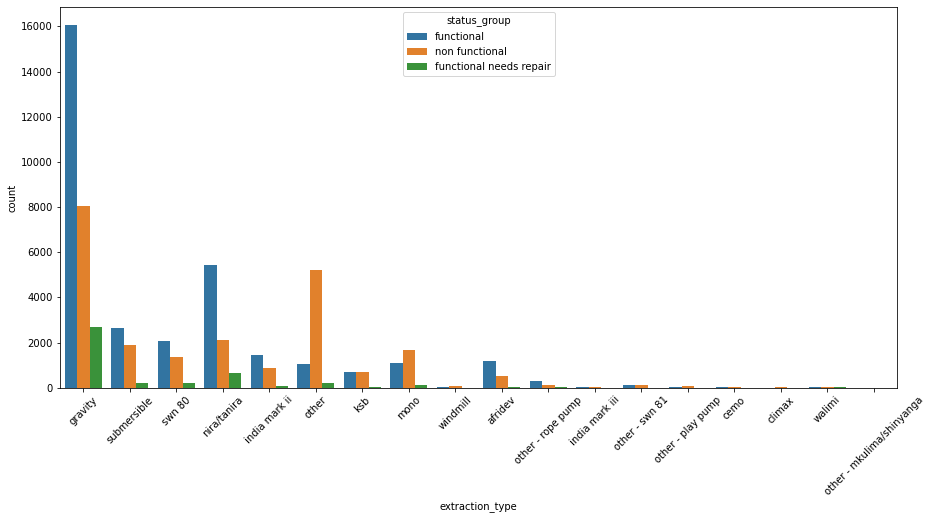

In [481]:
plt.figure(figsize=(15,7))
ax = sns.countplot(x='extraction_type', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)
# plt.xticks(rotation=90)

In [482]:
print(df['extraction_type_group'].isna().sum())
print(df['extraction_type_group'].nunique())
df['extraction_type_group'].value_counts()

0
13


gravity            26780
nira/tanira         8154
other               6430
submersible         6179
swn 80              3670
mono                2865
india mark ii       2400
afridev             1770
rope pump            451
other handpump       364
other motorpump      122
wind-powered         117
india mark iii        98
Name: extraction_type_group, dtype: int64

In [483]:
print(df['extraction_type_class'].isna().sum())
print(df['extraction_type_class'].nunique())
df['extraction_type_class'].value_counts()

0
7


gravity         26780
handpump        16456
other            6430
submersible      6179
motorpump        2987
rope pump         451
wind-powered      117
Name: extraction_type_class, dtype: int64

In [485]:
df.groupby(['extraction_type_class', 'extraction_type']).size()

extraction_type_class  extraction_type          
gravity                gravity                      26780
handpump               afridev                       1770
                       india mark ii                 2400
                       india mark iii                  98
                       nira/tanira                   8154
                       other - mkulima/shinyanga        2
                       other - play pump               85
                       other - swn 81                 229
                       swn 80                        3670
                       walimi                          48
motorpump              cemo                            90
                       climax                          32
                       mono                          2865
other                  other                         6430
rope pump              other - rope pump              451
submersible            ksb                           1415
                       

In [486]:
df.groupby(['extraction_type_class', 'extraction_type_group']).size()

extraction_type_class  extraction_type_group
gravity                gravity                  26780
handpump               afridev                   1770
                       india mark ii             2400
                       india mark iii              98
                       nira/tanira               8154
                       other handpump             364
                       swn 80                    3670
motorpump              mono                      2865
                       other motorpump            122
other                  other                     6430
rope pump              rope pump                  451
submersible            submersible               6179
wind-powered           wind-powered               117
dtype: int64

"extraction_type", "extraction_type_group" & "extraction_type_class" provide the details as regard the type of pumping system being used. Here, 'extraction_type_class' is sort of group version of "extraction_type" & "extraction_type_group". Here we will chose to keep "extraction_type_group" and remove other two. The reason we are removing "extraction_type" is because it has few categories which have very less no. of values.   

In [487]:
df.drop(columns=["extraction_type", "extraction_type_class"], inplace=True)

In [488]:
df.shape

(59400, 30)

##### 3.5.2.19 Column "payment", "payment_type"

In [489]:
print(df['payment'].isna().sum())
print(df['payment'].nunique())
df['payment'].value_counts()

0
7


never pay                25348
pay per bucket            8985
pay monthly               8300
unknown                   8157
pay when scheme fails     3914
pay annually              3642
other                     1054
Name: payment, dtype: int64

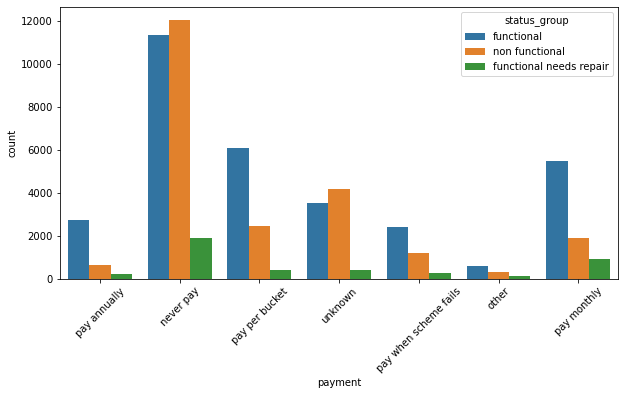

In [496]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x='payment', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

In [490]:
print(df['payment_type'].isna().sum())
print(df['payment_type'].nunique())
df['payment_type'].value_counts()

0
7


never pay     25348
per bucket     8985
monthly        8300
unknown        8157
on failure     3914
annually       3642
other          1054
Name: payment_type, dtype: int64

Here both features are providing similar information. We will remove one of them. 

In [491]:
df.drop(columns='payment_type', inplace=True)

In [492]:
df.shape

(59400, 29)

##### 3.5.2.20 Column "water_quality", "quality_group", "quantity", "quantity_group"

In [493]:
print(df['water_quality'].isna().sum())
print(df['water_quality'].nunique())
df['water_quality'].value_counts()

0
8


soft                  50818
salty                  4856
unknown                1876
milky                   804
coloured                490
salty abandoned         339
fluoride                200
fluoride abandoned       17
Name: water_quality, dtype: int64

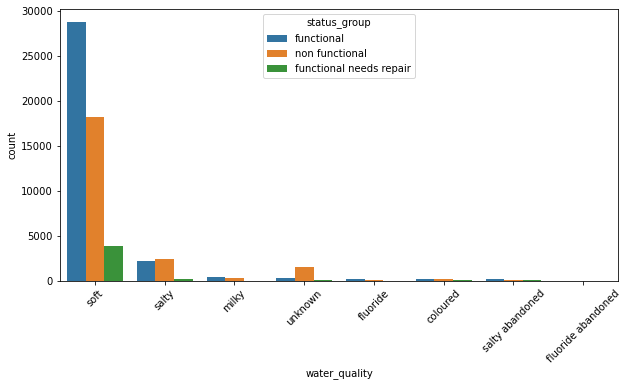

In [497]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x='water_quality', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

In [494]:
print(df['quality_group'].isna().sum())
print(df['quality_group'].nunique())
df['quality_group'].value_counts()

0
6


good        50818
salty        5195
unknown      1876
milky         804
colored       490
fluoride      217
Name: quality_group, dtype: int64

The columns are similar. The column "water_quality" tend to give more informayion than that of "quality_group" so we will drop "quality_group"

In [498]:
print(df['quantity'].isna().sum())
print(df['quantity'].nunique())
df['quantity'].value_counts()

0
5


enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity, dtype: int64

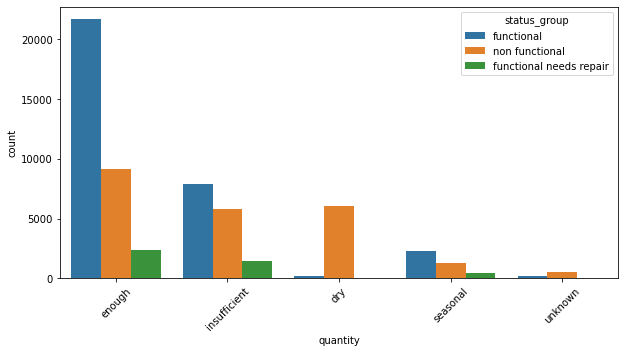

In [500]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x='quantity', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

In [499]:
print(df['quantity_group'].isna().sum())
print(df['quantity_group'].nunique())
df['quantity_group'].value_counts()

0
5


enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity_group, dtype: int64

quantity_group & quantity are similar. We will drop one of them 

In [501]:
df.drop(columns=["quality_group", "quantity_group"], inplace=True)

In [502]:
df.shape

(59400, 27)

##### 3.5.2.21 Column "source", "source_type", "source_class"

In [503]:
print(df['source'].isna().sum())
print(df['source'].nunique())
df['source'].value_counts()

0
10


spring                  17021
shallow well            16824
machine dbh             11075
river                    9612
rainwater harvesting     2295
hand dtw                  874
lake                      765
dam                       656
other                     212
unknown                    66
Name: source, dtype: int64

In [504]:
print(df['source_type'].isna().sum())
print(df['source_type'].nunique())
df['source_type'].value_counts()

0
7


spring                  17021
shallow well            16824
borehole                11949
river/lake              10377
rainwater harvesting     2295
dam                       656
other                     278
Name: source_type, dtype: int64

In [505]:
print(df['source_class'].isna().sum())
print(df['source_class'].nunique())
df['source_class'].value_counts()

0
3


groundwater    45794
surface        13328
unknown          278
Name: source_class, dtype: int64

In [506]:
df.groupby(['source_class', 'source']).size()

source_class  source              
groundwater   hand dtw                  874
              machine dbh             11075
              shallow well            16824
              spring                  17021
surface       dam                       656
              lake                      765
              rainwater harvesting     2295
              river                    9612
unknown       other                     212
              unknown                    66
dtype: int64

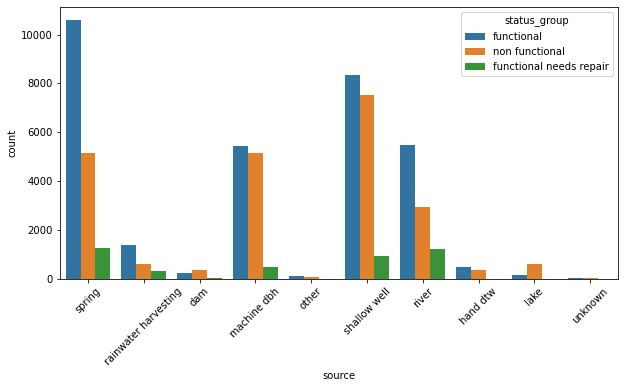

In [507]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x='source', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

Among above 3 columns we will choose to keep 'source' as it hase more information. We will drop rest two columns. 

In [508]:
df.drop(columns=["source_type", "source_class"], inplace=True)

In [509]:
df.shape

(59400, 25)

##### 3.5.2.22 Column "waterpoint_type", "waterpoint_type_group"

In [510]:
print(df['waterpoint_type'].isna().sum())
print(df['waterpoint_type'].nunique())
df['waterpoint_type'].value_counts()

0
7


communal standpipe             28522
hand pump                      17488
other                           6380
communal standpipe multiple     6103
improved spring                  784
cattle trough                    116
dam                                7
Name: waterpoint_type, dtype: int64

In [511]:
print(df['waterpoint_type_group'].isna().sum())
print(df['waterpoint_type_group'].nunique())
df['waterpoint_type_group'].value_counts()

0
6


communal standpipe    34625
hand pump             17488
other                  6380
improved spring         784
cattle trough           116
dam                       7
Name: waterpoint_type_group, dtype: int64

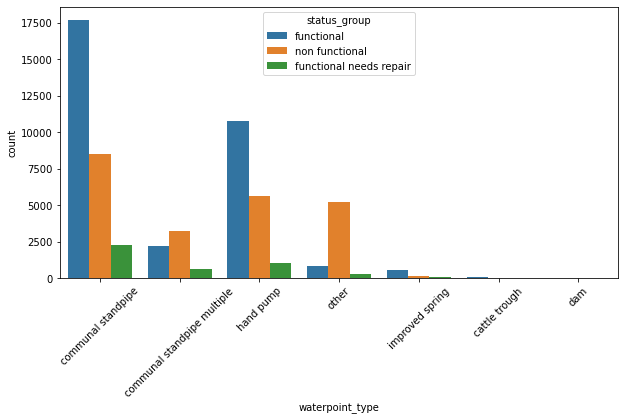

In [512]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x='waterpoint_type', hue="status_group", data=df)
ax.tick_params(axis='x', rotation=45)

here we will drop the column "waterpoint_type_group" as it has less information

In [517]:
df.drop(columns=["waterpoint_type_group"], inplace=True)

In [529]:
df.columns

Index(['id', 'amount_tsh', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'basin', 'region', 'district_code', 'lga', 'population',
       'public_meeting', 'permit', 'extraction_type_group', 'management',
       'payment', 'water_quality', 'quantity', 'source', 'status_group',
       'operational_year', 'waterpoint_type'],
      dtype='object')

In [530]:
df.shape

(59400, 23)

##### 3.5.2.23 Column "status_group"

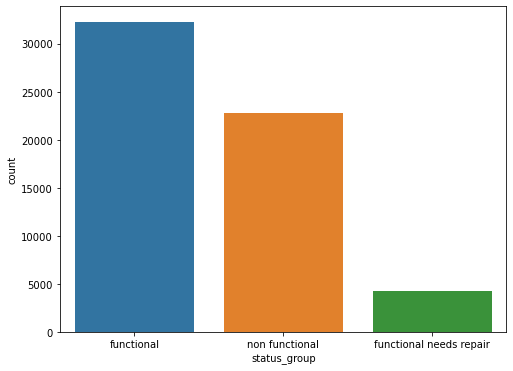

In [524]:
plt.figure(figsize=(8,6))
ax = sns.countplot(x="status_group", data=df)

From above plot of class labels i.e. "status_group", it is understood that the data is highly  imbalanced. 

In [532]:
df.head(5)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,district_code,lga,population,public_meeting,permit,extraction_type_group,management,payment,water_quality,quantity,source,status_group,operational_year,waterpoint_type
0,69572,6000.0,other,1390,other,34.938093,-9.856322,Lake Nyasa,Iringa,5,Ludewa,109.000000,True,False,gravity,vwc,pay annually,soft,enough,spring,functional,12,communal standpipe
1,8776,0.0,other,1399,other,34.698766,-2.147466,Lake Victoria,Mara,2,Serengeti,280.000000,True,True,gravity,wug,never pay,soft,insufficient,rainwater harvesting,functional,3,communal standpipe
2,34310,25.0,other,686,World Vision,37.460664,-3.821329,Pangani,Manyara,4,Simanjiro,250.000000,True,True,gravity,vwc,pay per bucket,soft,enough,dam,functional,4,communal standpipe multiple
3,67743,0.0,Unicef,263,UNICEF,38.486161,-11.155298,Ruvuma / Southern Coast,Mtwara,63,Nanyumbu,58.000000,True,True,submersible,vwc,never pay,soft,dry,machine dbh,non functional,27,communal standpipe multiple
4,19728,0.0,other,0,other,31.130847,-1.825359,Lake Victoria,Kagera,1,Karagwe,281.087167,True,True,gravity,other,never pay,soft,seasonal,rainwater harvesting,functional,15,communal standpipe


In [533]:
df.shape

(59400, 23)

#### 3.6 exporting cleaned data to CSV

In [534]:
df.to_csv('clean_df.csv') #exporting clean data to csv